<a href="https://colab.research.google.com/github/EugeneGene/terramind/blob/colab_compat/prithvi_eo_300_tl_burnscars.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Setup

### 1.1. In colab: Go to "Runtime" -> "Change runtime type" -> Select "T4 GPU"
### 1.2. Install TerraTorch

In [1]:
%%time
!pip install gdown tensorboard

In [2]:
!pip install terratorch==1.1

### 1.3 Imports

In [3]:
import os
import sys
import torch
import gdown
import terratorch
import albumentations
import lightning.pytorch as pl
import matplotlib.pyplot as plt
from pathlib import Path
from terratorch.datamodules import GenericNonGeoSegmentationDataModule

### 1.4. Download the dataset from Google Drive

In [4]:
if not os.path.isfile('hls_burn_scars.tar.gz'):
    gdown.download("https://drive.google.com/uc?id=1yFDNlGqGPxkc9lh9l1O70TuejXAQYYtC")
    !tar -xzvf hls_burn_scars.tar.gz

Downloading...
From (original): https://drive.google.com/uc?id=1yFDNlGqGPxkc9lh9l1O70TuejXAQYYtC
From (redirected): https://drive.google.com/uc?id=1yFDNlGqGPxkc9lh9l1O70TuejXAQYYtC&confirm=t&uuid=b35d8cfb-0a1c-482b-b8d0-afdd3d2de30f
To: /content/hls_burn_scars.tar.gz
100%|██████████| 2.65G/2.65G [00:29<00:00, 90.8MB/s]


._hls_burn_scars
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.macl'
hls_burn_scars/
hls_burn_scars/._.DS_Store
tar: Ignoring unknown extended header keyword 'SCHILY.fflags'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.FinderInfo'
hls_burn_scars/.DS_Store
hls_burn_scars/._data
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
hls_burn_scars/data/
hls_burn_scars/splits/
hls_burn_scars/splits/._train.txt
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.metadata:kMDItemWhereFroms'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.metadata:kMDItemDownloadedDate'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.macl'
hls_burn_scars/splits/train.txt
hls_burn_

# 2. HLS Burn Scars Dataset


### 2.1 Analyzing the dataset

In [5]:
dataset_path = Path('hls_burn_scars')
!ls "hls_burn_scars/"

data  splits


In [6]:
!ls "hls_burn_scars/data/" | head

subsetted_512x512_HLS.S30.T10SDH.2020248.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SDH.2020248.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2018190.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2018190.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2018245.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2018245.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2018280.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2018280.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2019305.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2019305.v1.4_merged.tif


### 2.2 Setup the dataset Module

In [7]:
datamodule = terratorch.datamodules.GenericNonGeoSegmentationDataModule(
    batch_size=8,
    num_workers=2,
    num_classes=2,

    # Define dataset paths
    train_data_root=dataset_path / 'data/',
    train_label_data_root=dataset_path / 'data/',
    val_data_root=dataset_path / 'data/',
    val_label_data_root=dataset_path / 'data/',
    test_data_root=dataset_path / 'data/',
    test_label_data_root=dataset_path / 'data/',

    # Define splits
    train_split=dataset_path / 'splits/train.txt',
    val_split=dataset_path / 'splits/val.txt',
    test_split=dataset_path / 'splits/test.txt',

    img_grep='*_merged.tif',
    label_grep='*.mask.tif',

    train_transform=[
        albumentations.D4(), # Random flips and rotation
        albumentations.pytorch.transforms.ToTensorV2(),
    ],
    val_transform=None,  # Using ToTensor() by default
    test_transform=None,

    # Define standardization values
    means=[
      0.0333497067415863,
      0.0570118552053618,
      0.0588974813200132,
      0.2323245113436119,
      0.1972854853760658,
      0.1194491422518656,
    ],
    stds=[
      0.0226913556882377,
      0.0268075602230702,
      0.0400410984436278,
      0.0779173242367269,
      0.0870873883814014,
      0.0724197947743781,
    ],
    # We use all six bands of the data, so we don't need to define dataset_bands and output_bands.
)

# Setup train and val datasets
datamodule.setup("fit")

### 2.3 Checking dataset split sizes

In [8]:
# checking datasets train split size
train_dataset = datamodule.train_dataset
len(train_dataset)

524

In [9]:
# checking datasets validation split size
val_dataset = datamodule.val_dataset
len(val_dataset)

160

### 2.4 Sample plots of validation data

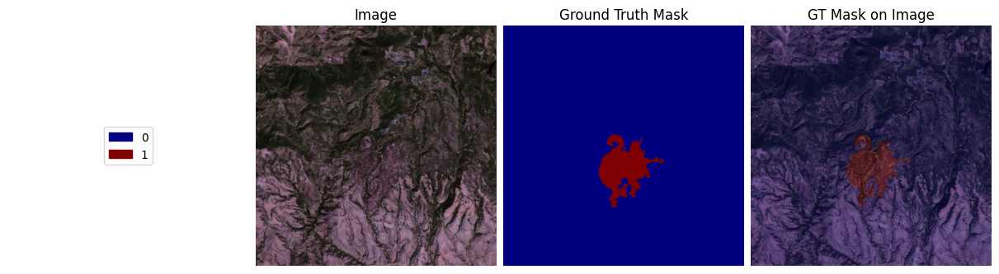

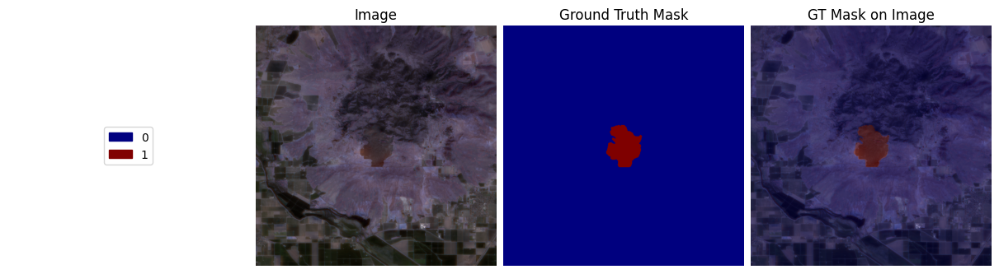

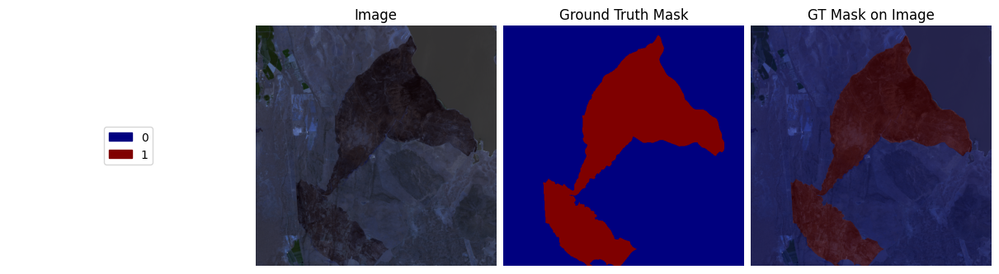

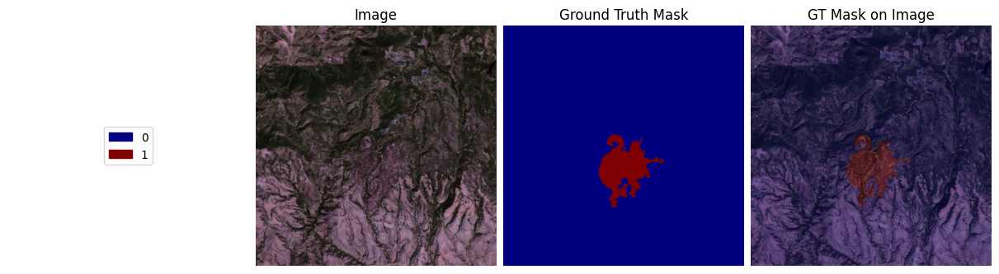

In [10]:
# plotting a few samples
val_dataset.plot(val_dataset[0])
val_dataset.plot(val_dataset[6])
val_dataset.plot(val_dataset[10])

### 2.5 Checking datasets testing split size

In [11]:

datamodule.setup("test")
test_dataset = datamodule.test_dataset
len(test_dataset)

120

# 3. Fine-tune Prithvi

### 3.1 Setup the model trainer

In [12]:

import gc
pl.seed_everything(0)

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    dirpath="output/burnscars/checkpoints/v2/",
    mode="max",
    monitor="val/mIoU", # Variable to monitor
    filename="best-{epoch:02d}",
)

# Lightning Trainer
trainer = pl.Trainer(
    accelerator="auto",
    strategy="auto",
    devices=1, # Deactivate multi-gpu because it often fails in notebooks
    precision='16-mixed',  # Speed up training
    num_nodes=1,
    logger=True,  # Uses TensorBoard by default
    max_epochs=20, # For demos
    log_every_n_steps=5,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback,
               pl.callbacks.RichProgressBar(),
               pl.callbacks.EarlyStopping(patience=20,
                                          monitor="val/mIoU",
                                          mode="max")
               ],
    check_val_every_n_epoch = 2,
    default_root_dir="output/burnscars",
)

# Model
model = terratorch.tasks.SemanticSegmentationTask(
    model_factory="EncoderDecoderFactory",
    model_args={
        # Backbone
        "backbone": "prithvi_eo_v2_300_tl", # Model can be either prithvi_eo_v1_100, prithvi_eo_v2_300, prithvi_eo_v2_300_tl, prithvi_eo_v2_600, prithvi_eo_v2_600_tl
        "backbone_pretrained": True,
        "backbone_num_frames": 1, # 1 is the default value
        "backbone_bands": ["BLUE", "GREEN", "RED", "NIR_NARROW", "SWIR_1", "SWIR_2"],
        "backbone_coords_encoding": [], # use ["time", "location"] for time and location metadata

        # Necks
        "necks": [
            {
                "name": "SelectIndices",
                # "indices": [2, 5, 8, 11] # indices for prithvi_eo_v1_100
                "indices": [5, 11, 17, 23] # indices for prithvi_eo_v2_300
                # "indices": [7, 15, 23, 31] # indices for prithvi_eo_v2_600
            },
            {"name": "ReshapeTokensToImage",},
            {"name": "LearnedInterpolateToPyramidal"}
        ],

        # Decoder
        "decoder": "UNetDecoder",
        "decoder_channels": [512, 256, 128, 64],

        # Head
        "head_dropout": 0.1,
        "num_classes": 2,
    },

    loss="dice",
    optimizer="AdamW",
    lr=1e-4,
    ignore_index=-1,
    freeze_backbone=True, # Only to speed up fine-tuning
    freeze_decoder=False,
    plot_on_val=True,
    class_names=['no burned', 'burned']  # optionally define class names
)

INFO: Seed set to 0
INFO:lightning.fabric.utilities.seed:Seed set to 0
INFO: Using 16bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Prithvi_EO_V2_300M_TL.pt:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

### 3.2 Load tensorboard to see results

In [13]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

### 3.3 Training the model

In [14]:
# Training
trainer.fit(model, datamodule=datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │  324 M │ train │
│ 1 │ criterion     │ DiceLoss         │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 20.3 M                                                                                           
Non-trainable params: 303 M                                                                                        
Total params: 324 M                                                                                                
Total estimated model params size (MB): 1.3 K                                                                      
Modules in train mode: 644                                                                                         
Modules in eval mode: 0

Output()

/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: The ``compute`` method of
metric MulticlassAccuracy was called before the ``update`` method which may lead to errors, as metric states have 
not yet been updated.
  warnings.warn(*args, **kwargs)

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


In [15]:
best_ckpt_path = trainer.checkpoint_callback.best_model_path

In [ ]:
# best_ckpt_path = "output/burnscars/checkpoints/best-epoch=01.ckpt"

### 3.4 Evaluating the model

In [16]:
trainer.test(model, datamodule=datamodule, ckpt_path=best_ckpt_path)

INFO: Restoring states from the checkpoint path at /content/output/burnscars/checkpoints/v2/best-epoch=01.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/output/burnscars/checkpoints/v2/best-epoch=01.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at /content/output/burnscars/checkpoints/v2/best-epoch=01.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at /content/output/burnscars/checkpoints/v2/best-epoch=01.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃          Test metric          ┃         DataLoader 0          ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/Accuracy         │              0.5              │
│  test/Class_Accuracy_burned   │              0.0              │
│ test/Class_Accuracy_no burned │              1.0              │
│         test/F1_Score         │      0.4724961221218109       │
│        test/IoU_burned        │              0.0              │
│      test/IoU_no burned       │      0.8957206606864929       │
│      test/Pixel_Accuracy      │      0.8957206606864929       │
│           test/loss           │              nan              │
│           test/mIoU           │      0.44786033034324646      │
│        test/mIoU_Micro        │      0.8111359477043152       │
└───────────────────────────────┴───────────────────────────────┘

[{'test/loss': nan,
  'test/Accuracy': 0.5,
  'test/Class_Accuracy_no burned': 1.0,
  'test/Class_Accuracy_burned': 0.0,
  'test/F1_Score': 0.4724961221218109,
  'test/IoU_no burned': 0.8957206606864929,
  'test/IoU_burned': 0.0,
  'test/Pixel_Accuracy': 0.8957206606864929,
  'test/mIoU': 0.44786033034324646,
  'test/mIoU_Micro': 0.8111359477043152}]

### 3.5 Running predictions & plotting

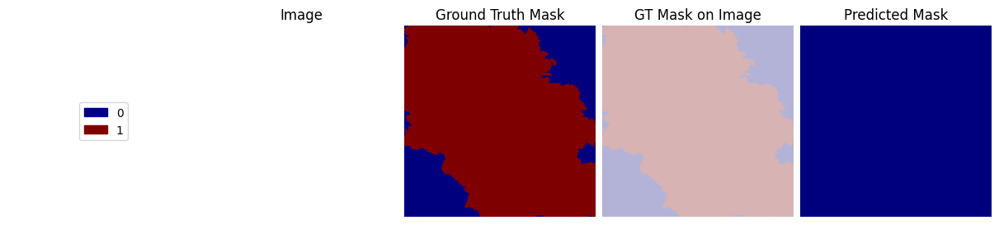

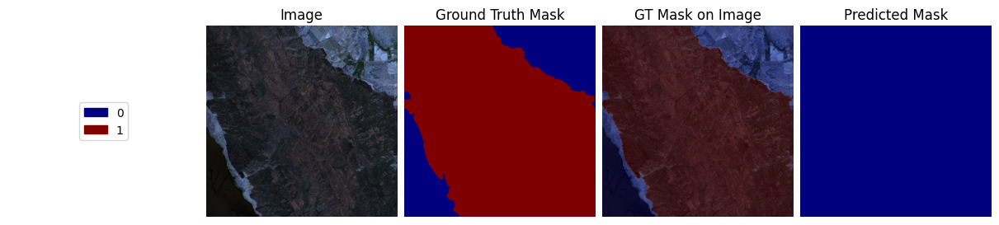

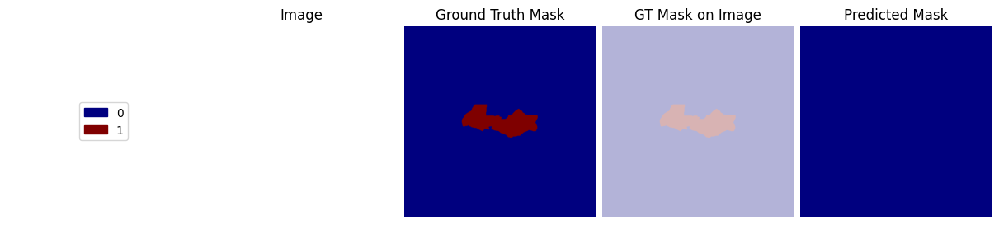

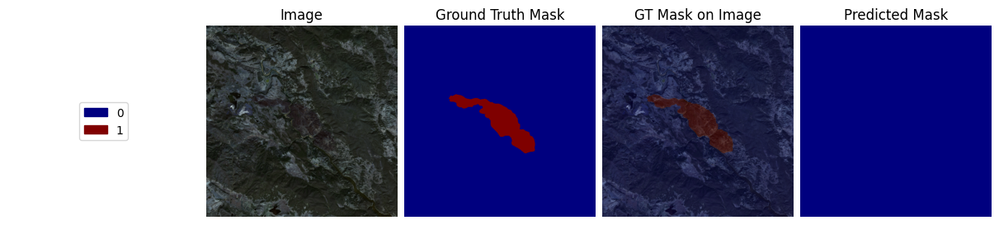

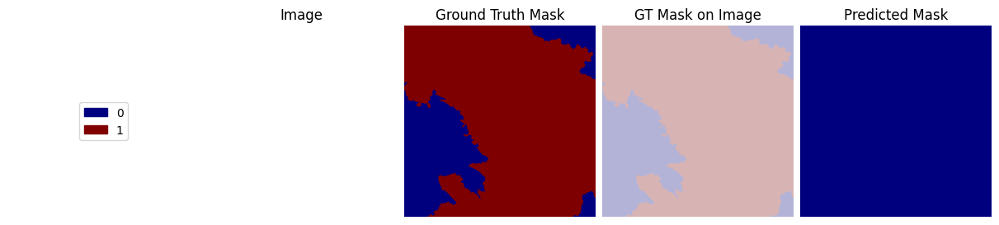

In [17]:
# now we can use the model for predictions and plotting!
model = terratorch.tasks.SemanticSegmentationTask.load_from_checkpoint(
    best_ckpt_path,
    model_factory=model.hparams.model_factory,
    model_args=model.hparams.model_args,
)

test_loader = datamodule.test_dataloader()
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(model.device)
    masks = batch["mask"].numpy()

    outputs = model(images)
    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(5):
    sample = {key: batch[key][i] for key in batch}
    sample["prediction"] = preds[i]
    test_dataset.plot(sample)

# 4. Fine-tuning via CLI

You might want to restart the session to free up GPU memory.

### 4.1  Download config

In [ ]:

!wget https://raw.githubusercontent.com/blumenstiel/TerraTorch-Examples/refs/heads/main/configs/prithvi_v2_eo_300_tl_unet_burnscars.yaml

### 4.2 Run Fine-tuning

In [ ]:
# Run fine-tuning
!terratorch fit -c prithvi_v2_eo_300_tl_unet_burnscars.yaml

# 5. Use HuggingFace Spaces to run inferences

https://huggingface.co/spaces/ibm-nasa-geospatial/Prithvi-EO-2.0-BurnScars-demo

### 5.1 Example of the spaces, If you have an image, upload it to the running demo and run an inference:


 ![Alt text for broken image link](https://github.com/WanjiruCate/pyconke-Prithvi-notebook/blob/main/images/spaces-burnscars.png?raw=1)

### 5.2 Example of predictions from a sample image

 ![Alt text for broken image link](https://github.com/WanjiruCate/pyconke-Prithvi-notebook/blob/main/images/spaces-burnscars-prediction.png?raw=1)